#### DBSCAN para analizar la asignación de cupos en los colegios de Bogotá

In [1]:
###Librerias
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from pca import pca
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_blobs
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
from kneed import KneeLocator

In [2]:
###Base de datos
#Se emplea la base de datos con los embeddings
Base=pd.read_csv("embedding_df.csv")
Base.head(5)

,0,1,2,3,4,5,6,7,8,9,...,759,760,761,762,763,764,765,766,767,texto
0,0.026229,0.009000,0.027059,-0.056850,-0.022927,-0.005288,0.039937,0.010887,-0.025599,-0.006642,...,0.005945,0.041146,-0.051710,-0.006032,0.000908,-0.006962,0.036058,-0.007850,0.002692,El estudiante candidato es Hombre y tiene 4 a...
1,-0.028091,-0.020587,0.045902,-0.012714,-0.010489,0.010037,0.030937,-0.001339,-0.029377,0.008227,...,0.036651,0.015262,-0.020024,0.010967,0.017517,-0.029042,-0.009266,0.004278,0.005128,El estudiante candidato es Hombre y tiene 6 a...
2,-0.008352,0.004420,0.049039,-0.059168,-0.001420,0.016631,-0.006374,0.009776,-0.045339,-0.008731,...,0.030664,0.026876,-0.022234,0.016187,0.031417,-0.027426,0.024747,0.010794,0.052607,El estudiante candidato es Mujer y tiene 8 añ...
3,0.019214,-0.022669,0.035043,-0.057416,-0.011307,-0.013409,0.005252,-0.020668,-0.010588,0.026330,...,-0.017690,0.011537,-0.000696,0.012235,-0.008382,-0.019532,0.010103,-0.009285,0.020471,El estudiante candidato es Hombre y tiene 3 a...
4,0.024607,0.026025,0.021370,-0.078242,-0.015760,-0.006322,0.018827,0.015122,-0.034345,-0.007886,...,0.005055,0.051883,-0.031466,0.014314,0.027445,-0.009717,0.045723,-0.002767,0.027288,El estudiante candidato es Mujer y tiene 4 añ...


In [3]:
#Eliminar la última variable
df= Base.iloc[:, :-1]
df.head()

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,0.026229,0.009000,0.027059,-0.056850,-0.022927,-0.005288,0.039937,0.010887,-0.025599,-0.006642,...,0.000033,0.005945,0.041146,-0.051710,-0.006032,0.000908,-0.006962,0.036058,-0.007850,0.002692
1,-0.028091,-0.020587,0.045902,-0.012714,-0.010489,0.010037,0.030937,-0.001339,-0.029377,0.008227,...,0.029167,0.036651,0.015262,-0.020024,0.010967,0.017517,-0.029042,-0.009266,0.004278,0.005128
2,-0.008352,0.004420,0.049039,-0.059168,-0.001420,0.016631,-0.006374,0.009776,-0.045339,-0.008731,...,0.019960,0.030664,0.026876,-0.022234,0.016187,0.031417,-0.027426,0.024747,0.010794,0.052607
3,0.019214,-0.022669,0.035043,-0.057416,-0.011307,-0.013409,0.005252,-0.020668,-0.010588,0.026330,...,0.022925,-0.017690,0.011537,-0.000696,0.012235,-0.008382,-0.019532,0.010103,-0.009285,0.020471
4,0.024607,0.026025,0.021370,-0.078242,-0.015760,-0.006322,0.018827,0.015122,-0.034345,-0.007886,...,-0.011344,0.005055,0.051883,-0.031466,0.014314,0.027445,-0.009717,0.045723,-0.002767,0.027288


Dado que se tienen 768 columnas debido al procesamiento de los embeddings, se decide realizar un análisis de componentes pincipales con el objetivo de reducir la dimensionalidad de los datos.

In [4]:
### Análisis de componentes principales
pcaX = PCA()
pcaX.fit(df)

PCA()

In [5]:
pd.DataFrame(pcaX.components_)

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,0.074061,0.040627,-0.037687,-0.028362,-0.038755,-0.035434,-0.039907,0.017491,-0.029381,-0.001155,...,-0.055616,-0.020566,0.037408,-0.002603,0.002067,-0.010960,0.032617,0.060301,-0.034951,0.003387
1,-0.020012,0.009912,0.011228,-0.026562,0.048146,0.003880,-0.063770,-0.022128,-0.012663,0.020535,...,0.005446,0.001989,-0.007933,0.081424,0.034525,0.024629,-0.042613,-0.020643,0.013147,0.050523
2,0.044218,-0.051533,0.040639,0.021239,0.021715,-0.011359,0.008104,-0.061979,-0.001714,0.039079,...,0.007409,-0.003646,-0.021718,0.011575,-0.032577,-0.098480,-0.005235,-0.038472,-0.010041,-0.048555
3,0.084103,0.039975,-0.028650,-0.092555,0.080058,-0.014684,0.010901,0.016810,-0.038787,-0.015584,...,-0.070909,0.021590,0.057429,0.018122,0.027376,-0.065057,-0.012424,0.013968,0.011518,0.001449
4,0.014566,0.070738,0.086215,0.026745,-0.040296,0.005042,0.033990,-0.003886,-0.066476,-0.020529,...,-0.033100,0.060911,0.026993,-0.055426,-0.068946,0.017510,-0.001148,0.031077,-0.011867,-0.035914
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
763,-0.006086,-0.029362,-0.026670,-0.020192,-0.007555,-0.077188,-0.064935,0.007085,0.046953,0.040641,...,-0.001706,0.079274,-0.009068,-0.029469,-0.061476,-0.030856,0.007411,0.012201,0.018716,0.016079
764,0.025335,-0.022733,-0.013437,-0.066625,0.041822,-0.004393,0.017931,-0.022844,0.009457,-0.011197,...,0.029821,0.050820,0.033401,-0.054454,0.024263,-0.017310,0.027529,0.031172,0.025980,0.003402
765,-0.010907,-0.012709,0.017251,0.046270,-0.006569,0.007676,-0.016131,-0.017128,-0.015641,-0.012054,...,-0.024536,0.002993,-0.015036,-0.011631,0.071435,-0.014454,-0.030935,-0.044011,0.025043,-0.016505
766,0.047488,0.030974,-0.031668,-0.027453,0.085757,-0.026395,0.004897,-0.000162,-0.017057,0.008066,...,0.004318,-0.000539,0.027046,-0.012535,-0.019583,-0.012688,0.083332,-0.024049,-0.006145,0.009202


In [6]:
#Varaianza explicada
explained_variance_ratio = pcaX.explained_variance_ratio_ * 100
df_variance = pd.DataFrame(explained_variance_ratio, columns=['Explained Variance (%)'])
df_variance['Cumulative Sum (%)'] = df_variance['Explained Variance (%)'].cumsum()
df_variance.head(20)

,Explained Variance (%),Cumulative Sum (%)
0,18.118170,18.118170
1,17.298009,35.416178
2,10.447463,45.863641
3,8.717342,54.580984
4,7.571338,62.152322
5,5.499892,67.652213
6,4.763479,72.415693
7,4.133941,76.549633
8,4.039937,80.589570
9,2.297584,82.887154


Se observa que el primer componente explica el 18% de la varianza total. Los dos primeros el 35% y los tres primeros explican el 45% de la varianza totas, y asi sucesivamente. Este calculo permite identificar cuantos componentes pricipales son suficientes o significativos para retener el porcentaje de varianza total deseado. Como en este caso se quiere reducir la dimensionalidad de los datos se decide escoger 9 componentes dado que retienen aproximadamente el 80% de la varianza explicada.

### PCA con 9 componentes
Se realiza el análisis de componentes principales con 9 componentes y a partir de esto se comienza a implementar el algoritmo de DBSCAN. 

In [19]:
model = pca(n_components=9)
df_pca9 = model.fit_transform(df, verbose=False)

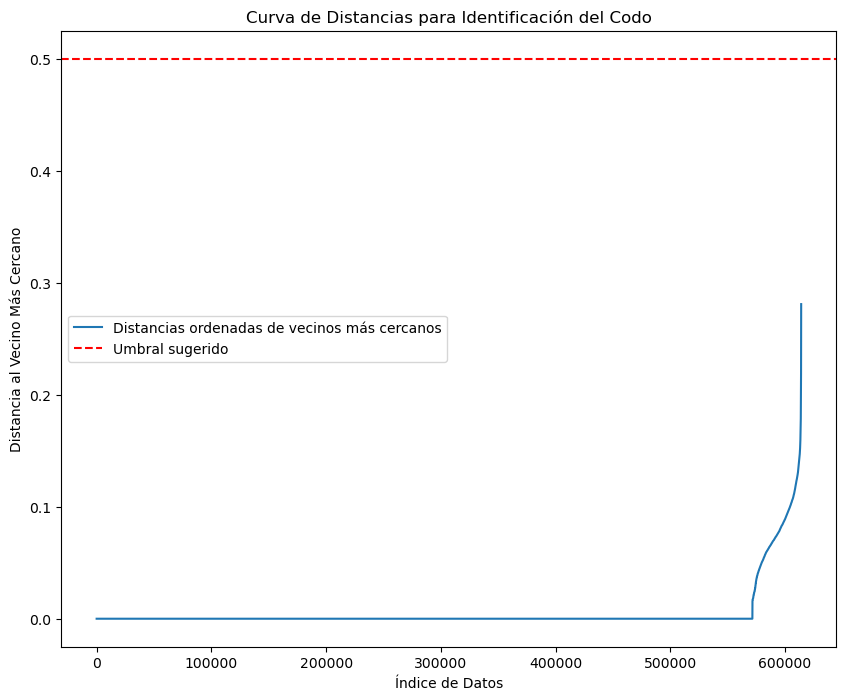

In [20]:
scores9 = df_pca9['PC']
#Ajuste del Modelo de Vecinos Cercanos con 10 vecinos
neigh = NearestNeighbors(n_neighbors=10)
nbrs = neigh.fit(scores9)

#Calculo de las distancias de cada punto a sus 10 vecinos más cercanos
distancias, indices = nbrs.kneighbors(scores9)
#Ordena las distancias en orden ascendente.
distancias = np.sort(distancias.flatten())

#Visualización de la Curva de Distancias:
plt.figure(figsize=(10, 8), dpi=100, facecolor='w', edgecolor='k')
plt.plot(distancias, label='Distancias ordenadas de vecinos más cercanos')
plt.axhline(y=0.5, color='r', linestyle='--', label='Umbral sugerido')
plt.title('Curva de Distancias para Identificación del Codo')
plt.xlabel('Índice de Datos')
plt.ylabel('Distancia al Vecino Más Cercano')
plt.legend()
plt.show()

In [21]:
#Identificación del punto de codo usando KneeLocator
i = np.arange(len(distancias))
knee = KneeLocator(i, distancias, S=1, curve='convex', direction='increasing', interp_method='polynomial')

#Print de los resultados del punto del codo
if knee.knee is not None:
    print(f"El punto de codo se encuentra en el índice: {knee.knee}")
    print(f"Distancia en el punto de codo: {distancias[knee.knee]:.4f}")
else:
    print("No se detectó un punto de codo claro en la curva.")

El punto de codo se encuentra en el índice: 536234
Distancia en el punto de codo: 0.0000


Inicialmente se utiliza la funcion de NearestNeighbors de scikit-learn para calcular las distancias al vecino más cercano. Esto ayuda a determinar el valor óptimo de eps utilizando la curva de distancia del punto de codo. Una práctica común para elegir un umbral adecuado que maximice la densidad de clusters. Se identifica el “punto de codo” usando KneeLocator, el cual ayuda a encontrar un punto de inflexión en la curva de distancias ordenadas. Para este El punto de codo señala una distancia de 0.0 esto como consecuencia de que las distancias son muy mínimas dado que los datos de los embeddings están normalizados. Por esta razón se decide determinar el eps de forma manual, identificando visualmente el punto de codo en el gráfico el cual se encuentra aproximadamente en 0.1.

Para la selección de los min_samples, se deja fijo la eps encontrada y se prueba con diferentes valores (de 2 a 50) para ver cómo varía el número de clusters formados. Siendo así, el código evalúa diferentes valores para el parámetro min_samples del algoritmo DBSCAN para encontrar un buen número de clusters. Para cada valor, se ajusta el modelo DBSCAN, se cuentan los clústers y se visualizan en un gráfico.

C:\Users\licet\AppData\Local\Temp\ipykernel_10176\1332637313.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


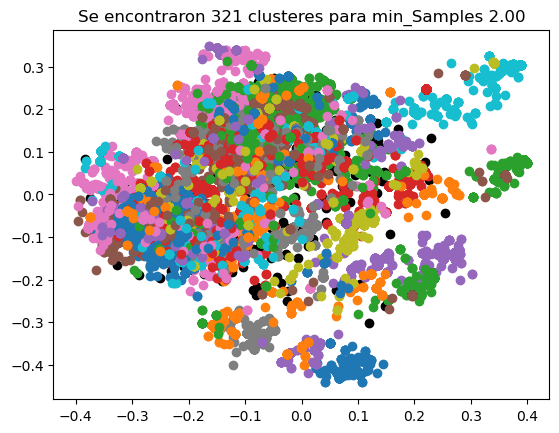

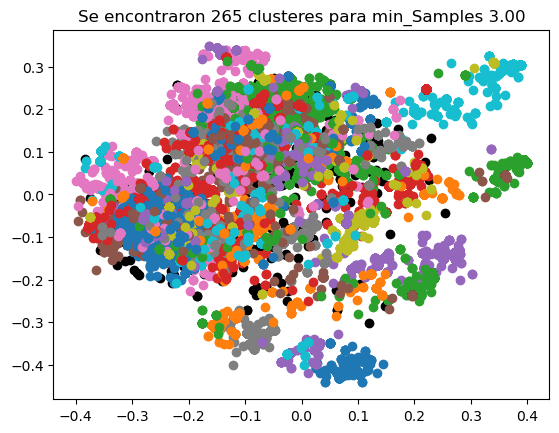

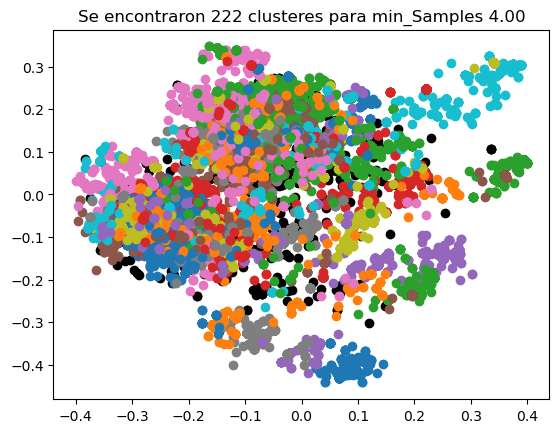

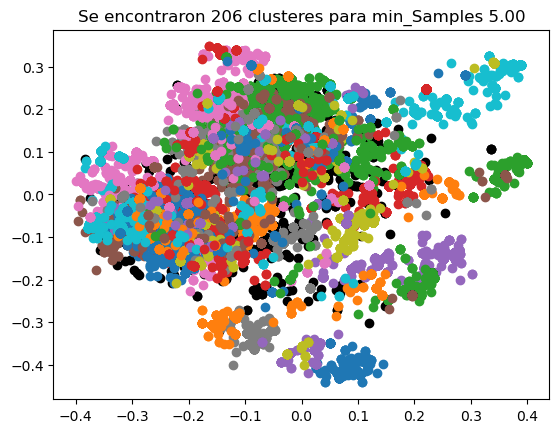

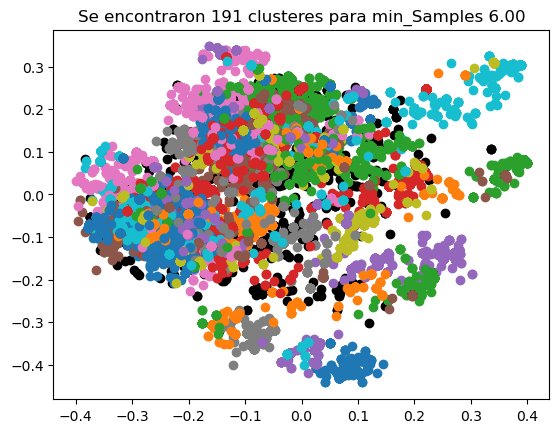

...

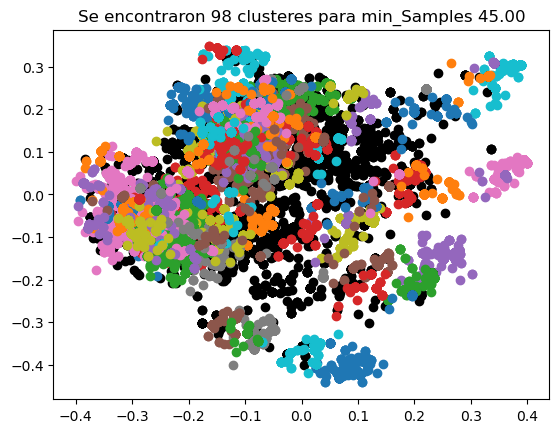

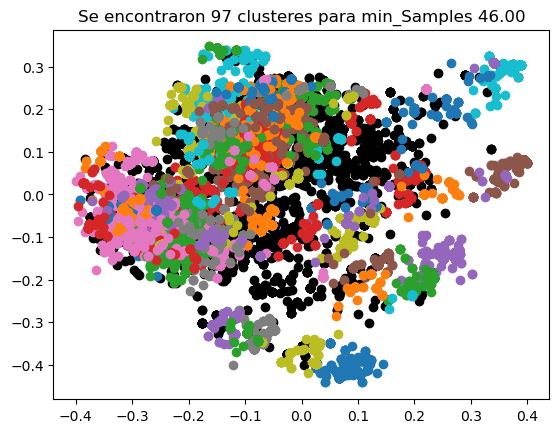

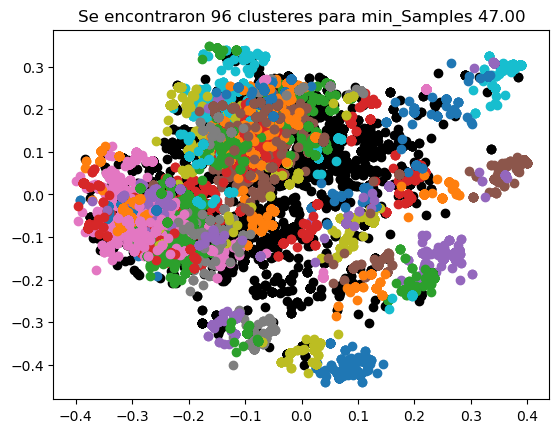

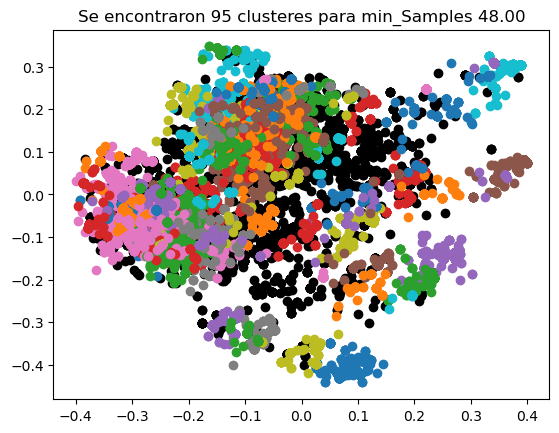

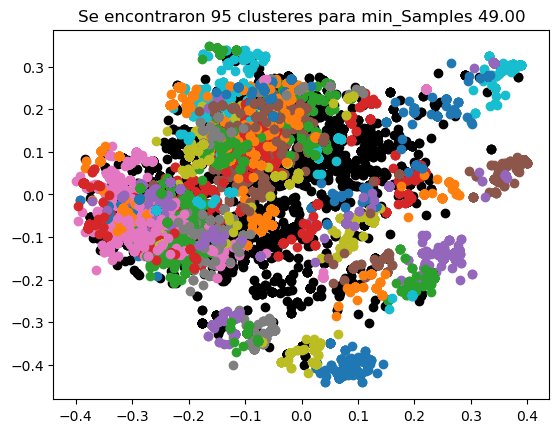

In [24]:
#Iteración sobre Valores de min_samples:
distancias[knee.knee]=0.1
for minpts in range(2,50):
    #Ajuste del Modelo DBSCAN:
    db = DBSCAN(eps = distancias[knee.knee], min_samples = minpts).fit(scores9)
    #Obtención de Etiquetas de Clusters y Conteo de Clusters
    clusteres = db.labels_
    n_clusteres = len(set(clusteres)) - (1 if -1 in clusteres else 0)
    #Creación de un DataFrame con Clusters y Visualización
    resultado = pd.DataFrame(scores9).assign(Cluster = clusteres)
    plt.figure()
    for k in np.unique(clusteres):
        if k != -1:
            plt.scatter(
                x = resultado.loc[resultado.Cluster == k, 'PC1'], 
                y = resultado.loc[resultado.Cluster == k, 'PC2']
                )
        else:
            plt.scatter(
                x = resultado.loc[resultado.Cluster == k, 'PC1'], 
                y = resultado.loc[resultado.Cluster == k, 'PC2'],
                c = "black"
                )
    plt.title('Se encontraron %d clusteres para min_Samples %0.2f' % (n_clusteres, minpts))

Con ayuda de los gráficos que muestran cómo se agrupan los puntos en clusters diferentes según los parámetros seleccionados se identifica que con 48 min samples es la que presenta una menor cantidad de clústeres 95, sin embargo 95 clusteres son demasiados para el análisis que se esta realizando.

Posteriormente, se prueba con un nuevo eps esta vez de 0.12.

C:\Users\licet\AppData\Local\Temp\ipykernel_10176\82154666.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


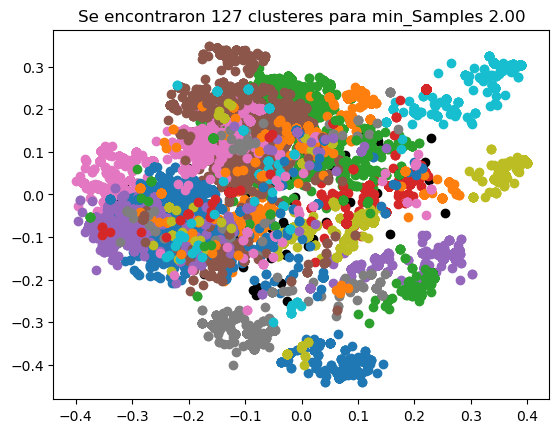

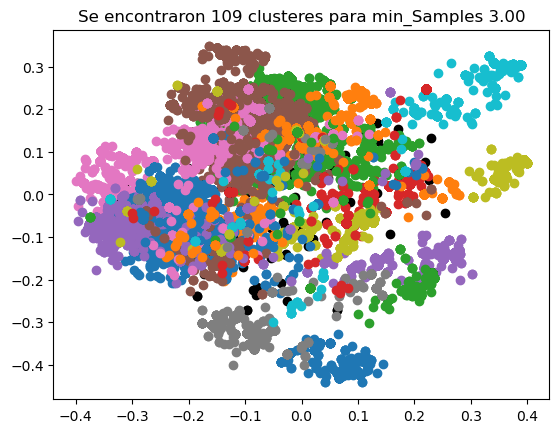

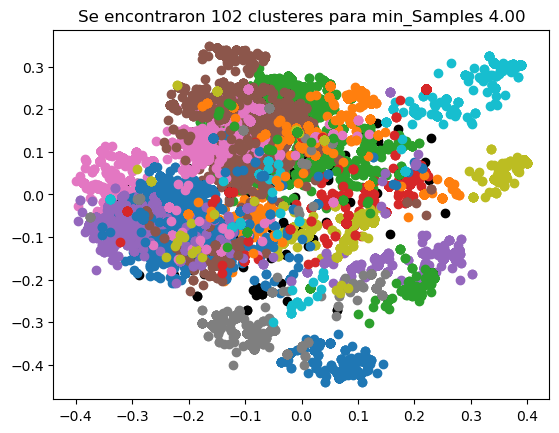

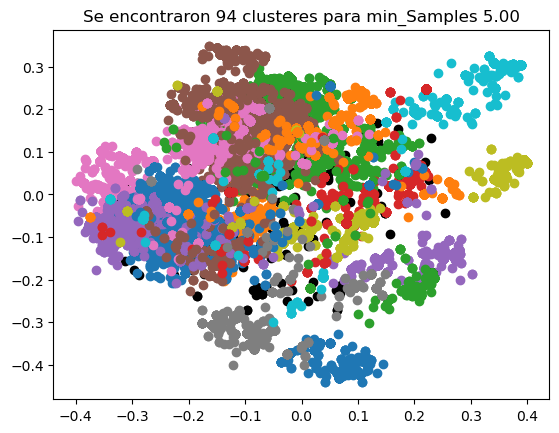

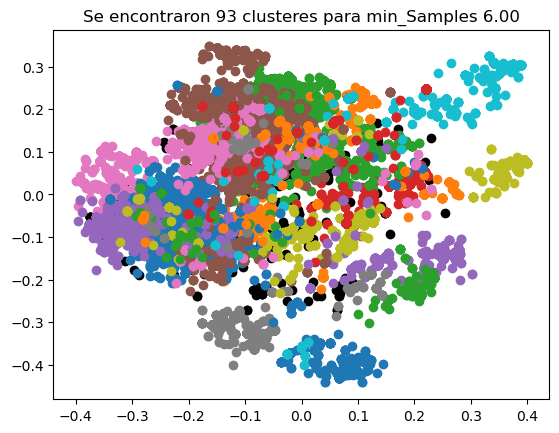

...

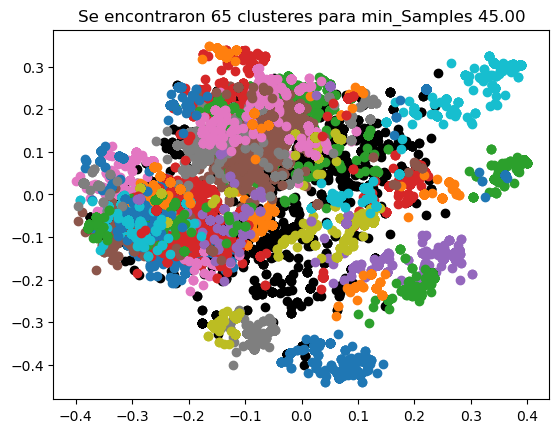

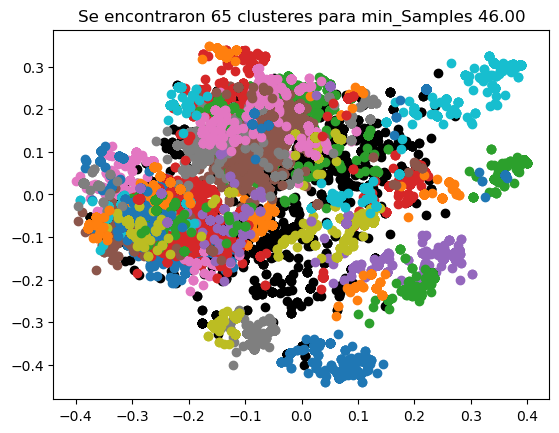

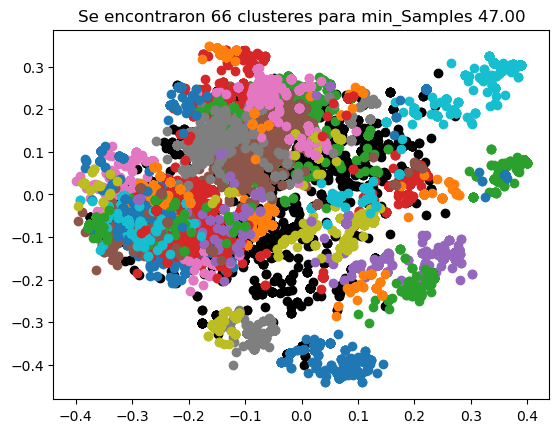

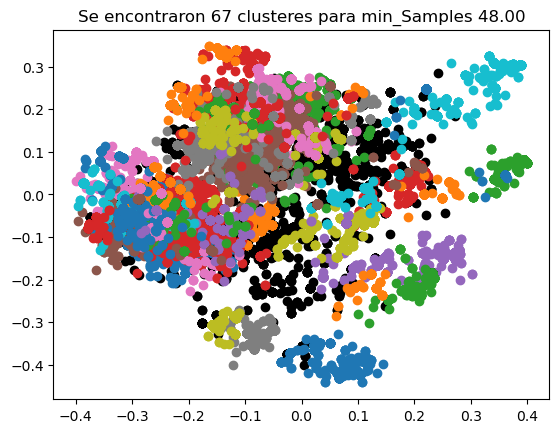

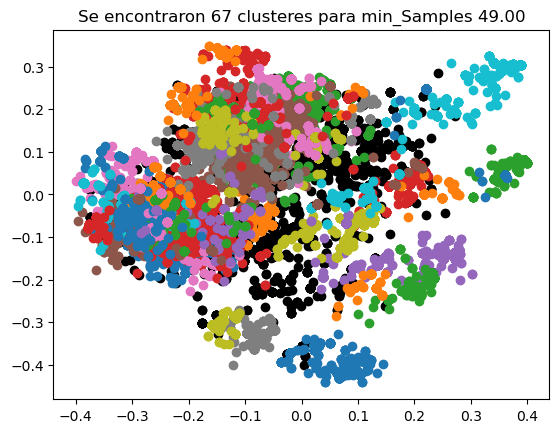

In [25]:
#Iteración sobre Valores de min_samples:
distancias[knee.knee]=0.12
for minpts in range(2,50):
    #Ajuste del Modelo DBSCAN:
    db = DBSCAN(eps = distancias[knee.knee], min_samples = minpts).fit(scores9)
    #Obtención de Etiquetas de Clusters y Conteo de Clusters
    clusteres = db.labels_
    n_clusteres = len(set(clusteres)) - (1 if -1 in clusteres else 0)
    #Creación de un DataFrame con Clusters y Visualización
    resultado = pd.DataFrame(scores9).assign(Cluster = clusteres)
    plt.figure()
    for k in np.unique(clusteres):
        if k != -1:
            plt.scatter(
                x = resultado.loc[resultado.Cluster == k, 'PC1'], 
                y = resultado.loc[resultado.Cluster == k, 'PC2']
                )
        else:
            plt.scatter(
                x = resultado.loc[resultado.Cluster == k, 'PC1'], 
                y = resultado.loc[resultado.Cluster == k, 'PC2'],
                c = "black"
                )
    plt.title('Se encontraron %d clusteres para min_Samples %0.2f' % (n_clusteres, minpts))

A partir de los resultados se identifica que con un min samples de 39 se tienen 63 clusteres, obteniendo de esta manera la menor cantidad de clusteres. Por esta razón el algoritmo DBSCAN tendrá los parámetros con eps = 0.12 y min_samples = 39.

In [45]:
#Modelo seleccionado
dbF = DBSCAN(eps = 0.12, min_samples = 39).fit(scores9)
clusteres=dbF.labels_
resultadoF = pd.DataFrame(scores9).assign(Cluster = clusteres)

In [46]:
## Cantidad de observaciones por cluster
resultadoF['Cluster'].value_counts().sort_values(ascending=False)

Cluster
13    5127
2     5015
0     4505
5     4375
4     4328
      ... 
61      61
45      56
48      55
53      51
62      38
Name: count, Length: 64, dtype: int64

In [78]:
## Se cargan los datos originales
Datos=pd.read_csv("Datos.csv")
Datos.head(5)

C:\Users\licet\AppData\Local\Temp\ipykernel_10176\3628400294.py:2: DtypeWarning: Columns (32,33,34) have mixed types. Specify dtype option on import or set low_memory=False.
  Datos=pd.read_csv("Datos.csv")


,FECHA_INSCRITO,INR_NACI_FECHA,INR_GRADO,GRD_NOMBRE,GRD_NIVEL_ESCOLAR,D_SEXO,INR_RES_CIUDAD,CIU_NOMBRE,INR_RES_LOCALIDAD,LOC_NOMBRE,...,AULAS Preescolar,AULAS 1-11,ÁREAS - PREESCOLAR,ÁREAS 1-11,CUPOS 2024,EDAD_INR,Decil ICFES,Ranking ICFES,DEMANDA VS CAPACIDAD %,DEMANDA VS OFERTA %
0,2023-09-01,2018-12-17,0,TRANSICIÓN (GRADO 0),PREESCOLAR,M,11001,BOGOTÁ D.C.,5,USME,...,1,13,30.91,482.54,120.0,4.0,4th Decile,558.0,36.038961,25.833333
1,2023-09-01,2017-07-11,1,PRIMERO,BASICA PRIMARIA,M,11001,BOGOTÁ D.C.,8,KENNEDY,...,NaN,19,0,1218.8899999999999,140.0,6.0,2nd Decile,613.0,17.726658,25.714286
2,2023-09-01,2015-06-01,1,PRIMERO,BASICA PRIMARIA,F,11001,BOGOTÁ D.C.,7,BOSA,...,NaN,34,0,2121,248.0,8.0,3rd Decile,583.0,39.191291,28.225806
3,2023-09-01,2020-01-23,-1,JARDIN,PREESCOLAR,M,11001,BOGOTÁ D.C.,7,BOSA,...,12,33,621.5,2462,120.0,3.0,1st Decile,656.0,6.932890,102.500000
4,2023-09-01,2019-02-19,0,TRANSICIÓN (GRADO 0),PREESCOLAR,F,11001,BOGOTÁ D.C.,19,CIUDAD BOLIVAR,...,1,8,29.09,331.23,320.0,4.0,9th Decile,135.0,8.992806,28.750000


In [84]:
## Unión de datos originales con los clusteres
Datos['Cluster']= resultadoF['Cluster']

In [107]:
## Agrupamiento de estadísticas por clúster
df_group = Datos.groupby('Cluster').agg({
    'GRD_NOMBRE': lambda x: x.value_counts().index[0],
    'GRD_NIVEL_ESCOLAR': lambda x: x.value_counts().index[0],
    'D_SEXO': lambda x: x.value_counts().index[0],
    'CIU_NOMBRE': lambda x: x.value_counts().index[0],
    'LOC_NOMBRE': lambda x: x.value_counts().index[0],
    'DIT_NOMBRE': lambda x: x.value_counts().index[0],
    'TAE_NOMBRE': lambda x: x.value_counts().index[0],
    'ETN_NOMBRE': lambda x: x.value_counts().index[0],
    'INR_ES_VICTIMA': lambda x: x.value_counts().index[0],
    'EDAD_INR': 'mean',
    'Decil ICFES': lambda x: x.value_counts().index[0],
    'Ranking ICFES':'mean'
}).reset_index()
df_group
# Mostrar el resultado agrupado
df_group=pd.DataFrame(df_group)
df_group.head(60)

,Cluster,GRD_NOMBRE,GRD_NIVEL_ESCOLAR,D_SEXO,CIU_NOMBRE,LOC_NOMBRE,DIT_NOMBRE,TAE_NOMBRE,ETN_NOMBRE,INR_ES_VICTIMA,EDAD_INR,Decil ICFES,Ranking ICFES
0,-1,"EDUCACIÓN PARA ADULTOS - CICLO 3 (GRADOS:6,7)",BASICA SECUNDARIA,F,BOGOTÁ D.C.,KENNEDY,NO APLICA,NO APLICA,NO APLICA,0,13.799145,3rd Decile,506.104968
1,0,TRANSICIÓN (GRADO 0),PREESCOLAR,M,BOGOTÁ D.C.,CIUDAD BOLIVAR,NO APLICA,NO APLICA,NO APLICA,0,4.000000,10th Decile,432.329856
2,1,PRIMERO,BASICA PRIMARIA,M,BOGOTÁ D.C.,KENNEDY,NO APLICA,NO APLICA,NO APLICA,0,6.000000,7th Decile,451.994898
3,2,TERCERO,BASICA PRIMARIA,F,BOGOTÁ D.C.,KENNEDY,NO APLICA,NO APLICA,NO APLICA,0,8.926022,7th Decile,465.118744
4,3,JARDIN,PREESCOLAR,M,BOGOTÁ D.C.,BOSA,NO APLICA,NO APLICA,NO APLICA,0,3.000000,10th Decile,454.013555
5,4,TRANSICIÓN (GRADO 0),PREESCOLAR,F,BOGOTÁ D.C.,CIUDAD BOLIVAR,NO APLICA,NO APLICA,NO APLICA,0,4.000000,10th Decile,428.665319
6,5,NOVENO,BASICA SECUNDARIA,F,BOGOTÁ D.C.,KENNEDY,NO APLICA,NO APLICA,NO APLICA,0,13.890971,5th Decile,500.387886
7,6,SEPTIMO,BASICA SECUNDARIA,M,BOGOTÁ D.C.,KENNEDY,NO APLICA,NO APLICA,NO APLICA,0,12.000000,4th Decile,497.156066
8,7,TRANSICIÓN (GRADO 0),PREESCOLAR,M,BOGOTÁ D.C.,CIUDAD BOLIVAR,NO APLICA,NO APLICA,NO APLICA,0,5.000000,10th Decile,437.566801
9,8,TRANSICIÓN (GRADO 0),PREESCOLAR,F,BOGOTÁ D.C.,CIUDAD BOLIVAR,NO APLICA,NO APLICA,NO APLICA,0,5.000000,10th Decile,434.061665


In [108]:
datos_concatenados = pd.merge(Datos, df_group, on="Cluster")
datos_concatenados.head()

,FECHA_INSCRITO,INR_NACI_FECHA,INR_GRADO,GRD_NOMBRE_x,GRD_NIVEL_ESCOLAR_x,D_SEXO_x,INR_RES_CIUDAD,CIU_NOMBRE_x,INR_RES_LOCALIDAD,LOC_NOMBRE_x,...,D_SEXO_y,CIU_NOMBRE_y,LOC_NOMBRE_y,DIT_NOMBRE_y,TAE_NOMBRE_y,ETN_NOMBRE_y,INR_ES_VICTIMA_y,EDAD_INR_y,Decil ICFES_y,Ranking ICFES_y
0,2023-09-01,2018-12-17,0,TRANSICIÓN (GRADO 0),PREESCOLAR,M,11001,BOGOTÁ D.C.,5,USME,...,M,BOGOTÁ D.C.,CIUDAD BOLIVAR,NO APLICA,NO APLICA,NO APLICA,0,4.0,10th Decile,432.329856
1,2023-09-01,2018-12-12,0,TRANSICIÓN (GRADO 0),PREESCOLAR,M,11001,BOGOTÁ D.C.,8,KENNEDY,...,M,BOGOTÁ D.C.,CIUDAD BOLIVAR,NO APLICA,NO APLICA,NO APLICA,0,4.0,10th Decile,432.329856
2,2023-09-01,2019-01-01,0,TRANSICIÓN (GRADO 0),PREESCOLAR,M,11001,BOGOTÁ D.C.,7,BOSA,...,M,BOGOTÁ D.C.,CIUDAD BOLIVAR,NO APLICA,NO APLICA,NO APLICA,0,4.0,10th Decile,432.329856
3,2023-09-01,2018-12-17,0,TRANSICIÓN (GRADO 0),PREESCOLAR,M,11001,BOGOTÁ D.C.,5,USME,...,M,BOGOTÁ D.C.,CIUDAD BOLIVAR,NO APLICA,NO APLICA,NO APLICA,0,4.0,10th Decile,432.329856
4,2023-09-01,2018-11-23,0,TRANSICIÓN (GRADO 0),PREESCOLAR,M,11001,BOGOTÁ D.C.,7,BOSA,...,M,BOGOTÁ D.C.,CIUDAD BOLIVAR,NO APLICA,NO APLICA,NO APLICA,0,4.0,10th Decile,432.329856


* El cluster de ruido lo componen mujeres que hacen el curso de EDUCACIÓN PARA ADULTOS - CICLO 3, de Kennedy, en un colegio con décil 3.
* No se presenta una segmentación por las variables de discapacidad, etnia y victima del conflicto armado dadas las pocas observaciones que hay en estas. Por esta razón se decide tomar la segunda opción mas común en estas variables por cada clúster.
* En talento solo se encuentran el no aplica y Talento excepcional en actividad física, ejercicio y deporte

In [109]:
###cluster 13
df_group[df_group['Cluster'] == 13]

,Cluster,GRD_NOMBRE,GRD_NIVEL_ESCOLAR,D_SEXO,CIU_NOMBRE,LOC_NOMBRE,DIT_NOMBRE,TAE_NOMBRE,ETN_NOMBRE,INR_ES_VICTIMA,EDAD_INR,Decil ICFES,Ranking ICFES
14,13,TERCERO,BASICA PRIMARIA,M,BOGOTÁ D.C.,KENNEDY,NO APLICA,NO APLICA,NO APLICA,0,8.648917,7th Decile,475.520967


In [110]:
Cluster13=Datos[Datos['Cluster'] == 13]
Cluster13

,FECHA_INSCRITO,INR_NACI_FECHA,INR_GRADO,GRD_NOMBRE,GRD_NIVEL_ESCOLAR,D_SEXO,INR_RES_CIUDAD,CIU_NOMBRE,INR_RES_LOCALIDAD,LOC_NOMBRE,...,AULAS 1-11,ÁREAS - PREESCOLAR,ÁREAS 1-11,CUPOS 2024,EDAD_INR,Decil ICFES,Ranking ICFES,DEMANDA VS CAPACIDAD %,DEMANDA VS OFERTA %,Cluster
22,2023-09-01,2015-02-10,4,CUARTO,BASICA PRIMARIA,M,11001,BOGOTÁ D.C.,11,SUBA,...,25,0,1864,88.0,8.0,8th Decile,385.0,11.061947,56.818182,13
72,2023-09-01,2014-12-01,4,CUARTO,BASICA PRIMARIA,M,11001,BOGOTÁ D.C.,10,ENGATIVA,...,43,106.5,1963.4939999999988,280.0,8.0,6th Decile,475.0,44.292605,18.571429,13
97,2023-09-01,2016-06-06,2,SEGUNDO,BASICA PRIMARIA,M,11001,BOGOTÁ D.C.,8,KENNEDY,...,21,0,988.4,144.0,7.0,7th Decile,446.0,21.944809,9.722222,13
99,2023-09-01,2016-05-05,2,SEGUNDO,BASICA PRIMARIA,M,11001,BOGOTÁ D.C.,19,CIUDAD BOLIVAR,...,13,NaN,583.71,194.0,7.0,3rd Decile,595.0,29.555556,13.402062,13
135,2023-09-01,2015-04-04,2,SEGUNDO,BASICA PRIMARIA,M,11001,BOGOTÁ D.C.,11,SUBA,...,NaN,NaN,NaN,360.0,8.0,10th Decile,27.0,NaN,1.111111,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61370,2023-10-30,2014-05-06,5,QUINTO,BASICA PRIMARIA,M,11001,BOGOTÁ D.C.,7,BOSA,...,14.0,0.0,771.61,140.0,9.0,5th Decile,500.0,47.811448,20.714286,13
61379,2023-10-30,2014-04-17,5,QUINTO,BASICA PRIMARIA,M,11001,BOGOTÁ D.C.,19,CIUDAD BOLIVAR,...,21.0,NaN,1166.52,210.0,9.0,2nd Decile,609.0,28.005658,6.190476,13
61380,2023-10-30,2003-07-12,10,DÉCIMO,MEDIA,M,11001,BOGOTÁ D.C.,19,CIUDAD BOLIVAR,...,26.0,221.51,1259.62,240.0,20.0,3rd Decile,578.0,40.228571,11.666667,13
61385,2023-10-30,2013-01-28,6,SEXTO,BASICA SECUNDARIA,M,11001,BOGOTÁ D.C.,5,USME,...,15.0,0.0,716.47,198.0,10.0,6th Decile,479.0,5.797101,5.555556,13


In [111]:
import seaborn as sns
df=Cluster13
def topn_bars(col, n):
    test_ = df[col].value_counts().reset_index()
    test_.loc[:n,'In top n?'] = 1
    test_ = test_.fillna(0)
    otros_ = test_[test_['In top n?'] == 0]['count'].sum()
    data_ = pd.concat([test_.iloc[:n], pd.DataFrame({col: ['Otros'], 'count': [otros_], 'In top n?': [0]})], ignore_index=True)
    
    ax = sns.barplot( data = data_, x= col, y = 'count')    
    ax.bar_label(container=ax.containers[0])
    plt.xticks(rotation = 45, fontsize = 8, ha= 'right')
    ax.set(title = f'Top {n} barras para {col}')
    plt.show()

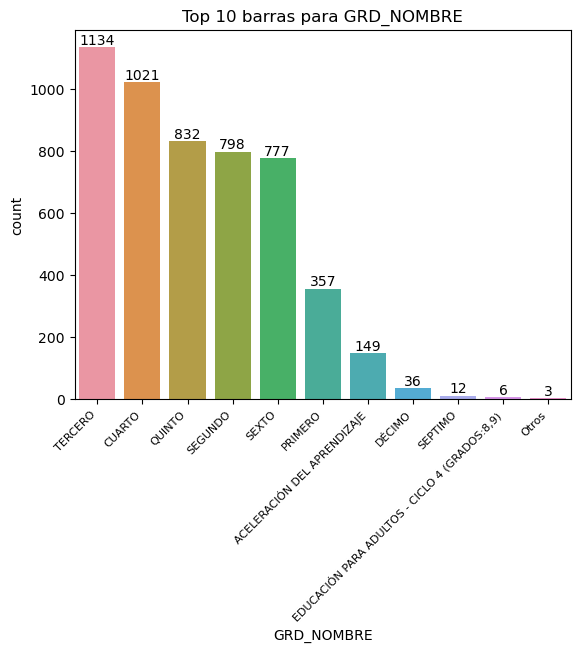

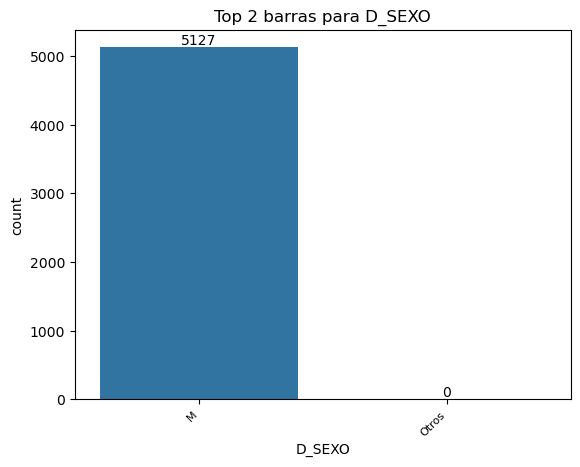

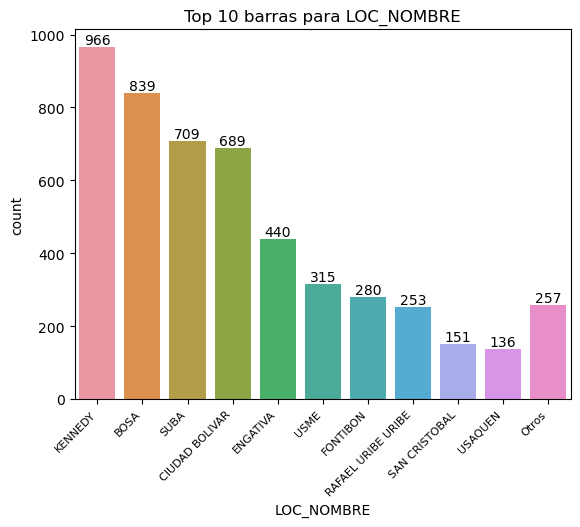

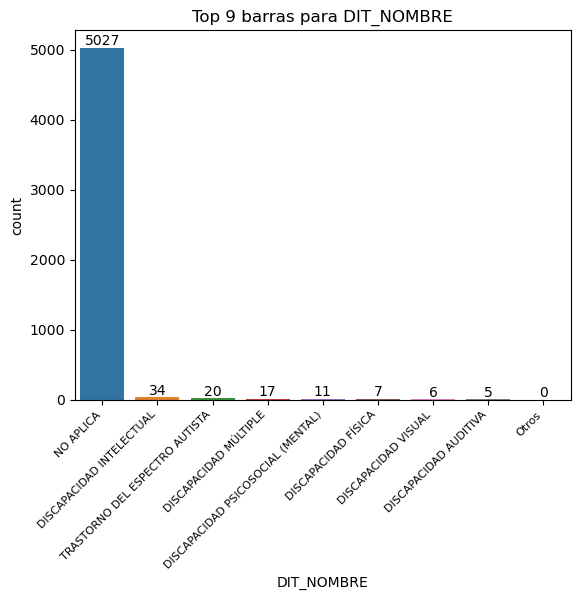

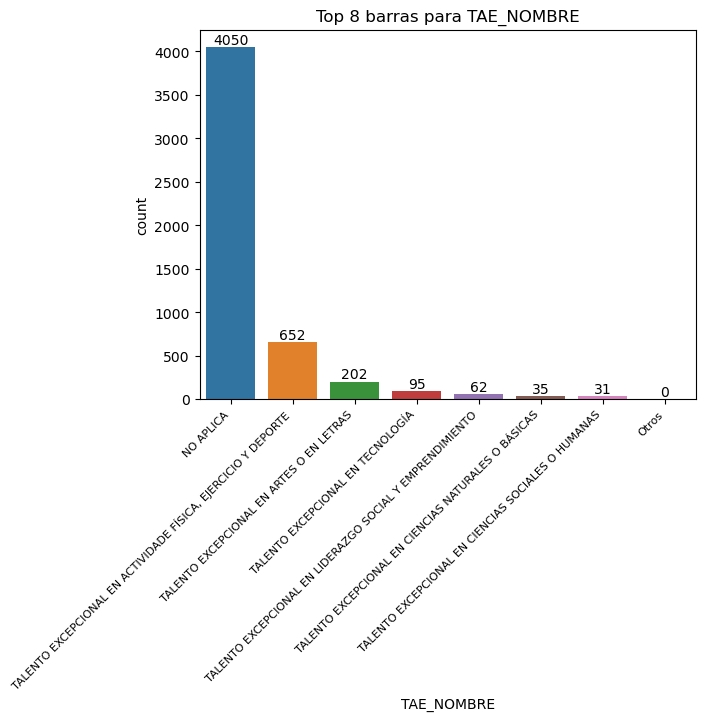

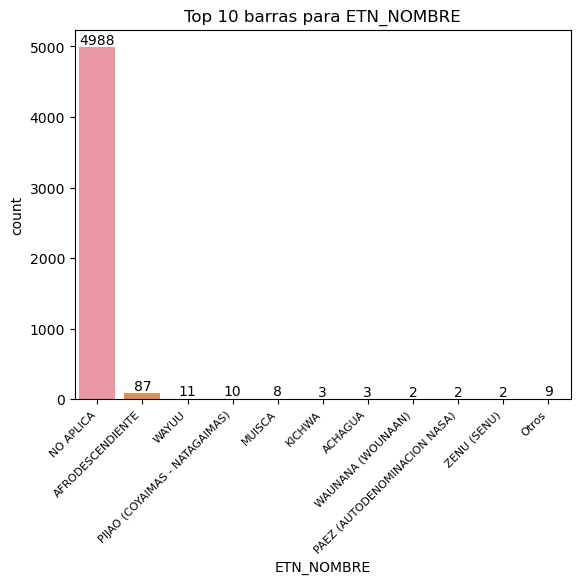

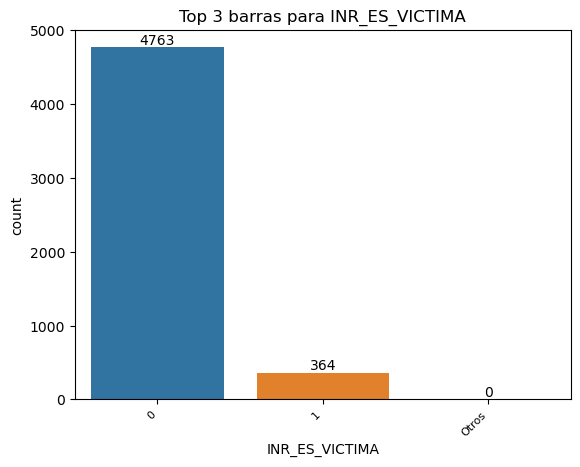

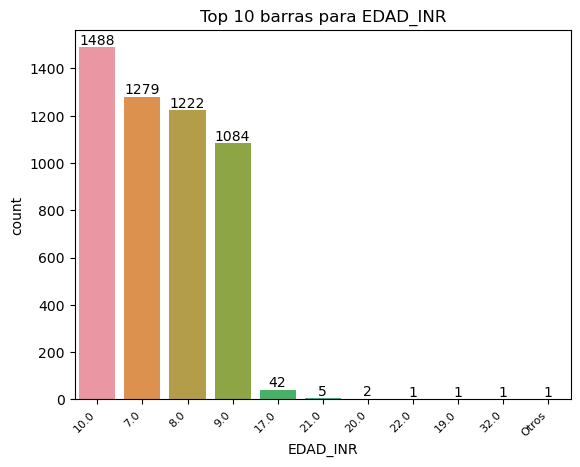

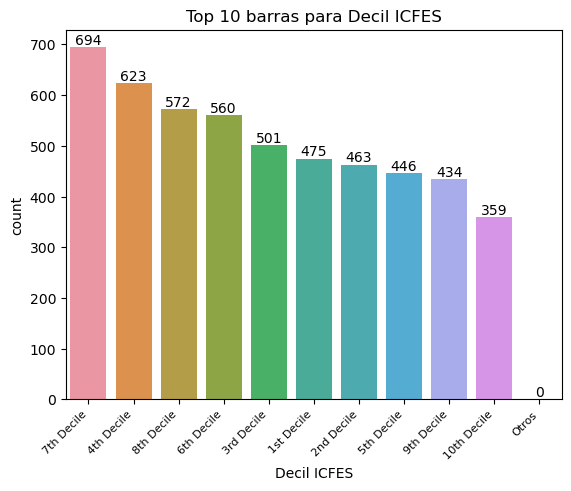

In [112]:
columnas =['GRD_NOMBRE', 'D_SEXO', 'LOC_NOMBRE', 'DIT_NOMBRE', 'TAE_NOMBRE', 'ETN_NOMBRE', 'INR_ES_VICTIMA' , 'EDAD_INR', 'Decil ICFES']
for col in df.columns:
    if col in columnas and len(df[col].unique()) < 25:
        try:
            topn_bars(col, min(len(df[col].unique())+1,10))
        except:
            continue

* El cluster 13 mantiene que la mayoría de sus estudiantes pertenecen al grado de tercero, todos son hombres, la mayoría no tiene una discapacidad pero la segunda categoría con mayor cantidad de datos presentan discapacidad intelectual, la misma situación pasa con la variable etnía en donde afrodescendiente se presenta en 87 estudiantes, siendo así el cluster 13 esta agrupando correctamente, sin embargo tambien hay observaciones que no cumplen con todas las características establecidas por ende generan ruido dentro del cluster.

In [102]:
df_group[df_group['Cluster'] == 62]

,Cluster,GRD_NOMBRE,GRD_NIVEL_ESCOLAR,D_SEXO,CIU_NOMBRE,LOC_NOMBRE,DIT_NOMBRE,TAE_NOMBRE,ETN_NOMBRE,INR_ES_VICTIMA,EDAD_INR,Decil ICFES,Ranking ICFES
63,62,DÉCIMO,BASICA SECUNDARIA,M,BOGOTÁ D.C.,KENNEDY,DISCAPACIDAD PSICOSOCIAL (MENTAL),"TALENTO EXCEPCIONAL EN ACTIVIDADE FÍSICA, EJER...",NO APLICA,0,15.0,4th Decile,512.868421


In [104]:
Cluster62=Datos[Datos['Cluster'] == 62]
df=Cluster62

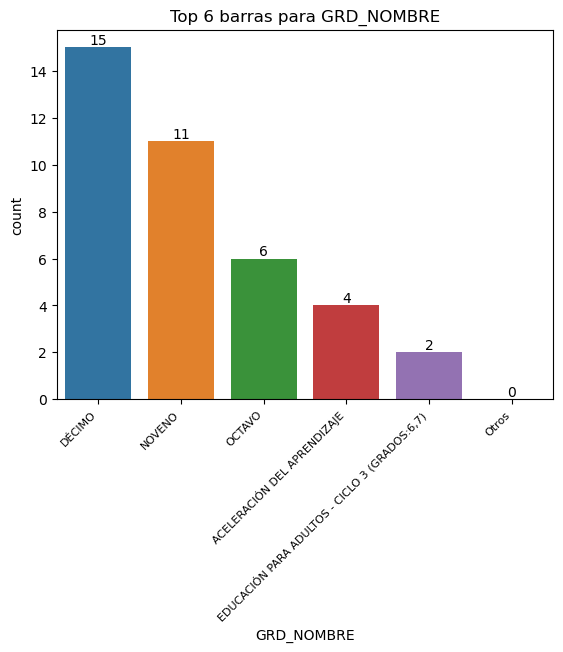

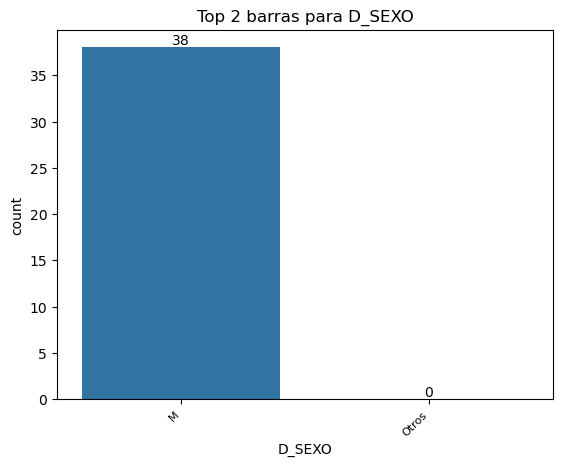

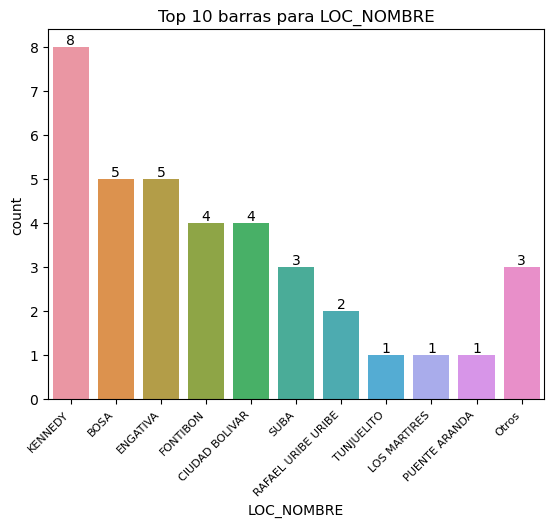

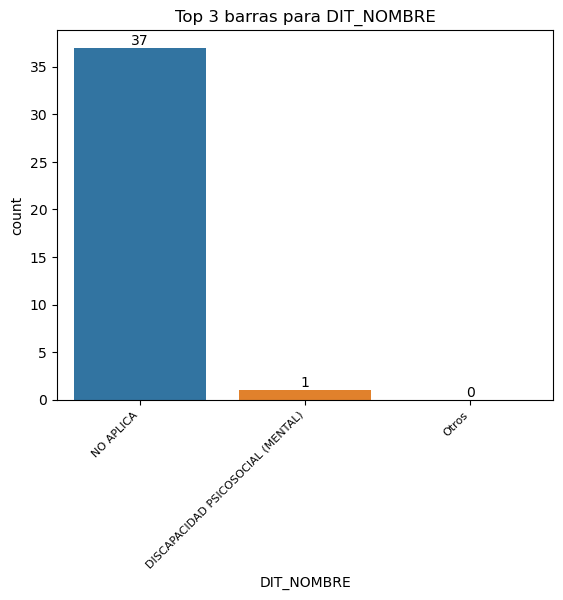

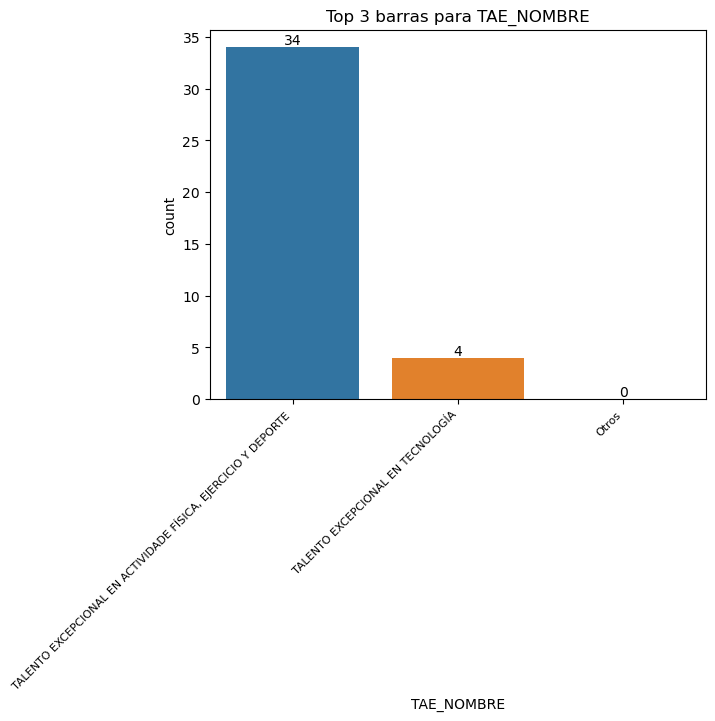

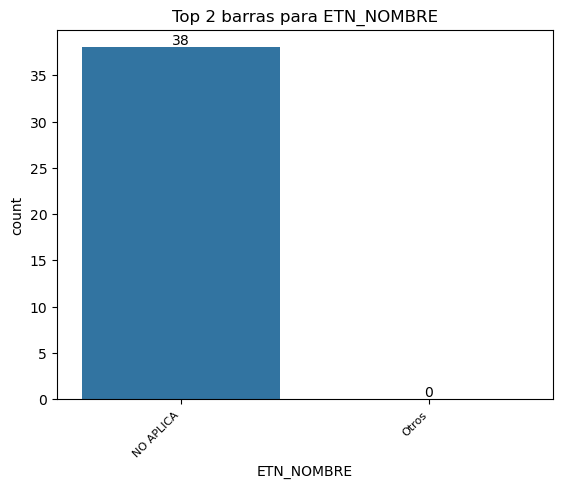

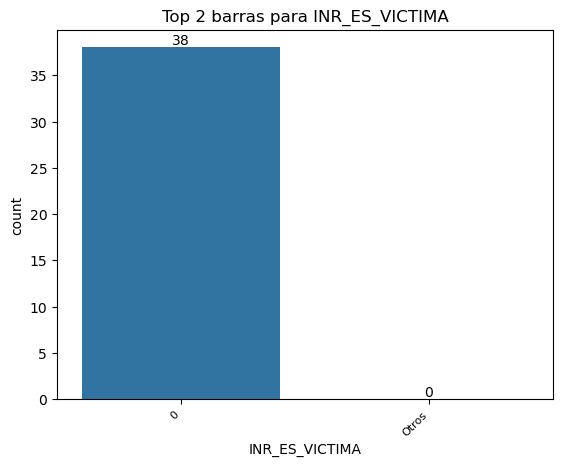

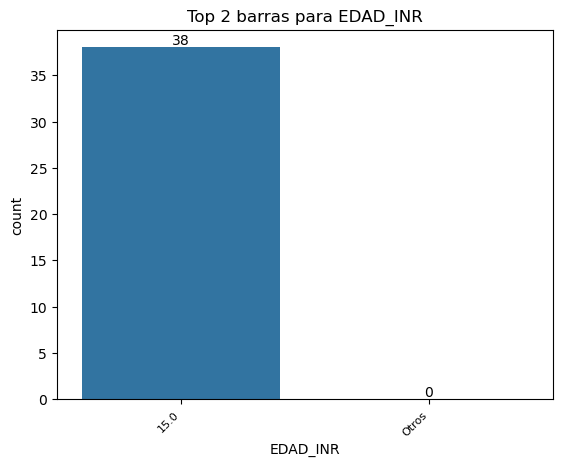

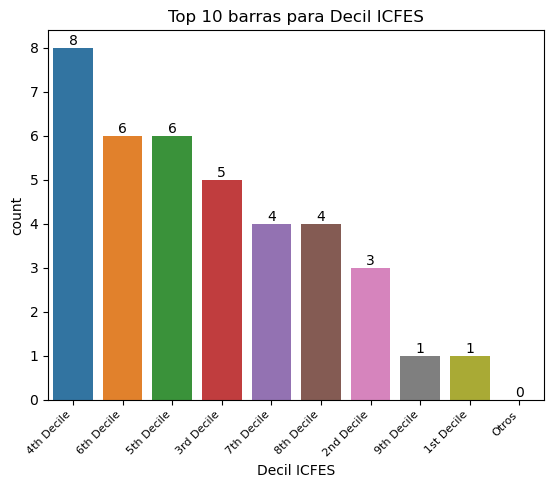

In [105]:
for col in df.columns:
    if col in columnas and len(df[col].unique()) < 25:
        try:
            topn_bars(col, min(len(df[col].unique())+1,10))
        except:
            continue